In [7]:
from nmon import *

In [ ]:
'''
100 1 - EJ
GPU : 
tensorflow - no advantage
pytorch - eigh not implemented

C++:
cython numpy - 5 sec (real), 20 sec (complex)
numba numpy - 8 sec (real), 30 sec (complex)

tensorflow - 8 sec (real), 55 sec (complex)

spla - 10 sec (real), 16 sec (complex)

External C++:
Too slow


TODO:
1. check sparsity level for (100, 1) and (100, 100) and (1, 1) - same cutoff
2. does the matrix have to be complex?

3. Solve Tridiagonal, the rest is perturbation
4. Change of basis for Tensor decomp.: study the formation of the hamiltonian from sym representation

'''

In [3]:
# 4: [-41.46471811+0.j -35.53234488+0.j -28.8431822 +0.j -21.32688482+0.j
#  -16.05431261+0.j -16.0290009 +0.j]
# 5: [-41.54062779+0.j -36.04419614+0.j -30.42242255+0.j -24.45158685+0.j
#  -18.08311486+0.j -16.13045264+0.j]
# 6: [-41.55022952+0.j -36.13829209+0.j -30.83341516+0.j -25.54799887+0.j
#  -20.16946512+0.j -16.13915904+0.j]

In [10]:
N = 1
M = 3
EC_shunt = 0.18 * 1

nmon = Nmon(N=N, M=M, EJN=100*EC_shunt, EJM=1*EC_shunt, EC_shunt=EC_shunt)

nmon.hamiltonian_calc(flux=0.0, ng=[0.0, 0, 0, 0], num_levels=3, make_plot=False, just_H=True, cutoff=7)#compute_cutoff(nmon.EJN, nmon.EJM, nmon.EC_total, cutoff_space=[2, 8]))

# nmon.H_arr = nmon.nmon_circ.hamiltonian().toarray() # sparse array

# nmon.H_arr = (np.real(nmon.H_arr))
# nmon.bound_state_energies, nmon.H_arr

# print(nmon.H_arr)

EJM_idx, EJN_idx = np.where(nmon.H_arr[0] != 0)[0][1:][0], np.where(nmon.H_arr[0] != 0)[0][1:][-1]
# np.absolute(max(np.diag(nmon.H_arr)) / nmon.H_arr.shape[0]**2 / (M*nmon.H_arr[0, EJM_idx] + N * nmon.H_arr[0, EJN_idx]) )
np.absolute(max(np.diag(nmon.H_arr)) / (nmon.H_arr.shape[0]**(1/3) - 1 )/2  / (M*nmon.H_arr[0, EJM_idx] + N * nmon.H_arr[0, EJN_idx]) ) / 1e3

2.2025038769544993

In [3]:
# eigenvalues = tf.linalg.eigvalsh(nmon.H)
eigenvalues, eigenvectors = tf.linalg.eigh(nmon.H_arr)
eigenvalues

In [13]:

eval, evec = spla.eigsh(nmon.H.real, which='SA', k=3)
eval

array([-15.5349854 , -10.69747533,  -6.05111544])

                    sp | tf                                                 

100 1,   cut=2 : 0.0 s | 0.0 s  ||| [-14.82436878,  -7.3115815 ,   1.85772136] !!!!!!!! tf
100 1,   cut=4 : 0.0 s | 0.0 s  ||| [-15.52048935, -10.56065419,  -5.47046177]
100 1,   cut=5 : 0.0 s | 0.0 s  ||| [-15.53396771, -10.68407465,  -5.97106947]
100 1,   cut=6 : 0.0 s | 0.0 s  ||| [-15.53494184, -10.6967349 ,  -6.0452567 ]
100 1,   cut=7 :  32 s | 0.0 s  ||| [-15.5349854 , -10.69747533,  -6.05111544] !!!!!!!! tf
100 1,   cut=8 : >30 s | 0.0 s  ||| [-15.5349854 , -10.69747533,  -6.05111544]

Reducing cutoff on the external nodes threw the progress back to the level of the uniform cutoff of that magnitude

In [20]:

# TODO check for ratio, 10
# TODO check for ratio, ratio again

# Generate all combinations of ng values
ng_probes = [0, 0.25, 0.5, 0.75]
ng_combinations = np.array(list(combinations_with_replacement(ng_probes, N + M - 1)))

ratios_list = np.linspace(1, 100, 10)

w01_min_list=np.zeros_like(ratios_list)
w01_max_list=np.zeros_like(ratios_list)

ng_max_list=np.empty_like(ratios_list, dtype=object)
ng_min_list=np.empty_like(ratios_list, dtype=object)

for i, ratio in enumerate(ratios_list):
    w01_min = np.inf
    w01_max = 0
    ng_min = 0
    ng_max = 0

    nmon = Nmon(N=N, M=M, EJN=ratio*EC_shunt, EJM=ratio*EC_shunt, EC_shunt=EC_shunt)

    for ng in tqdm(ng_combinations):
        nmon.hamiltonian_calc(flux=0, ng=ng, num_levels=3, make_plot=False, just_H=False,
                                cutoff=compute_cutoff(nmon.EJN, nmon.EJM, nmon.EC_total, cutoff_space=[2, 8]))
        if nmon.transition_freqs[0] < w01_min:
            w01_min = nmon.transition_freqs[0]
            ng_min = ng
        
        if nmon.transition_freqs[0] > w01_max:
            w01_max = nmon.transition_freqs[0]
            ng_max = ng

    w01_min_list[i] = w01_min
    w01_max_list[i] = w01_max

    ng_max_list[i] = ng_max
    ng_min_list[i] = ng_min

100%|██████████| 20/20 [00:00<00:00, 28.37it/s]
 /var/folders/54/_13g4g016975q4kygn1_b9jw0000gn/T/ipykernel_78221/3933565220.py: 35ComplexWarning: Casting complex values to real discards the imaginary part
100%|██████████| 20/20 [01:31<00:00,  4.56s/it]


In [21]:
print(ng_max_list)
print(ng_min_list)

[array([0.  , 0.25, 0.5 ]) array([0.  , 0.25, 0.5 ])
 array([0. , 0.5, 0.5]) array([0. , 0.5, 0.5]) array([0. , 0.5, 0.5])
 array([0.5, 0.5, 0.5]) array([0.5, 0.5, 0.5]) array([0.25, 0.75, 0.75])
 array([0.5, 0.5, 0.5]) array([0.25, 0.75, 0.75])]
[array([0.5, 0.5, 0.5]) array([0.5, 0.5, 0.5]) array([0., 0., 0.])
 array([0., 0., 0.]) array([0., 0., 0.]) array([0., 0., 0.])
 array([0., 0., 0.]) array([0., 0., 0.]) array([0., 0., 0.])
 array([0., 0., 0.])]


In [25]:

w01_disp_ng = []
for i, ratio in enumerate(tqdm(ratios_list)):    
    nmon = Nmon(N=N, M=M, EJN=ratio*EC_shunt, EJM=ratio*EC_shunt, EC_shunt=EC_shunt)

    nmon.hamiltonian_calc(flux=0.0, ng=[0.0, 0, 0, 0], num_levels=3, make_plot=False, just_H=True, cutoff=compute_cutoff(nmon.EJN, nmon.EJM, nmon.EC_total, cutoff_space=[2, 8]))

    # nmon.H_arr = nmon.nmon_circ.hamiltonian().toarray() # sparse array

    # nmon.H_arr = (np.real(nmon.H_arr))
    # nmon.bound_state_energies, nmon.H_arr

    # print(nmon.H_arr)

    EJM_idx, EJN_idx = np.where(nmon.H_arr[0] != 0)[0][1:][0], np.where(nmon.H_arr[0] != 0)[0][1:][-1]
    # np.absolute(max(np.diag(nmon.H_arr)) / nmon.H_arr.shape[0]**2 / (M*nmon.H_arr[0, EJM_idx] + N * nmon.H_arr[0, EJN_idx]) )
    up_value = max(np.diag(nmon.H_arr)) / (nmon.H_arr.shape[0]**(1/3) - 1 )/2
    EJM_sum = M*nmon.H_arr[0, EJM_idx]
    EJN_sum = N*nmon.H_arr[0, EJN_idx]
    w01_disp_ng.append(np.absolute( up_value / (EJM_sum)) / 2e4 + np.absolute( up_value / (EJN_sum)) / 2e4 )

100%|██████████| 10/10 [00:01<00:00,  7.04it/s]


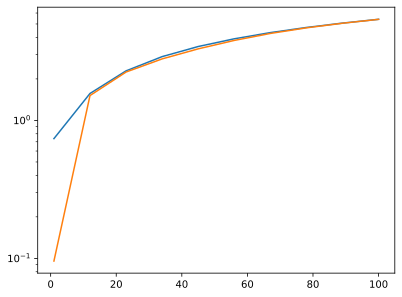

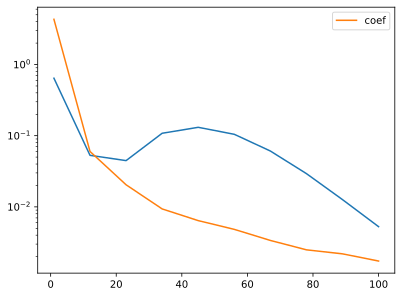

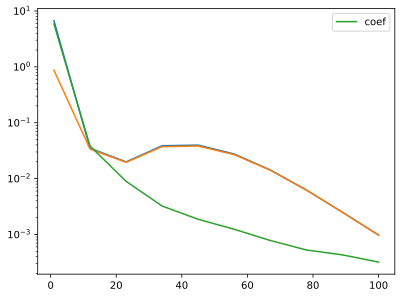

In [28]:
plt.plot(ratios_list, w01_max_list)
plt.plot(ratios_list, w01_min_list)

plt.yscale('log')

plt.show()

plt.plot(ratios_list, [w01_max_list[i] - w01_min_list[i] for i, ratio in enumerate(ratios_list)])
plt.plot(ratios_list, w01_disp_ng, label='coef')
plt.legend()
plt.yscale('log')

plt.show()

plt.plot(ratios_list, [(w01_max_list[i] - w01_min_list[i])/w01_min_list[i] for i, ratio in enumerate(ratios_list)])
plt.plot(ratios_list, [(w01_max_list[i] - w01_min_list[i])/w01_max_list[i]  for i, ratio in enumerate(ratios_list)])

plt.plot(ratios_list, [w01_disp_ng[i]/w01_max_list[i]  for i, ratio in enumerate(ratios_list)], label='coef')
# plt.plot(ratios_list, [w01_disp_ng[i]/w01_min_list[i]  for i, ratio in enumerate(ratios_list)], label='coef')
plt.legend()
plt.yscale('log')
# plt.xscale('log')
plt.show()

In [53]:
# size = nmon.H.shape[0]
# nmon.H = np.real(nmon.H)
# for i in range(size):
#     for j in range(size):
#         print(round(nmon.H[i,j], 1), end=' ')
#         pass
#     print()



                  sp | tf                                                 | OLD ng coef

1 1,   cut=1 : 0.0 s | 0.0 s  ||| [-0.02187445,  0.71970418,  0.74154947] | 44.455824355414215
1 1,   cut=2 : 0.0 s | 0.0 s  ||| [-0.02195492,  0.71594954,  0.73786556] | 8.296523764504824     !!!!!!!! tf
1 1,   cut=3 : 0.2 s | 0.0 s  ||| [-0.02195495,  0.71594709,  0.73786312] | 2.479193733868309 
1 1,   cut=4 : 2.4 s | 0.1 s  ||| [-0.02195495,  0.71594709,  0.73786312] | 0.9757108226154014
1 1,   cut=5 : 8.7 s | 1.0 s  ||| [-0.02195495,  0.73786312,  0.71594709] | 0.45734095460298807 

5 5,   cut=1 : 0.0 s | 0.0 s  ||| [-0.37485497,  1.08739994,  0.71618909] | 1.778427617825579
5 5,   cut=2 : 0.0 s | 0.0 s  ||| [-0.3914459 ,  0.62486178,  1.00709703] | 0.33189727574908084 
5 5,   cut=3 : 0.2 s | 0.0 s  ||| [-0.39160497,  0.62345754,  1.0055348 ] | 0.0991786041577372    !!!!!!!! tf
5 5,   cut=4 : 1.0 s | 0.2 s  ||| [-0.39160539,  0.62345285,  1.00552898] | 0.03903270491798253  

10 10, cut=3 : 0.2 s | 0.0 s  ||| [-1.07470807,  0.34501917,  1.30896177] | 0.024798031487033613
10 10, cut=4 : 0.8 s | 0.2 s  ||| [-1.07473195,  0.34478686,  1.30844558] | 0.009759506637548408  !!!!!!!! tf
10 10, cut=5 : 1.7 s | 1.0 s  ||| [-1.07473204,  0.34478581,  1.30844285] | 0.004574533743621237
10 10, cut=8 : 8.6 s | 51.8 s ||| [-1.07473204,  0.3447858 ,  1.30844284] |

20 20, cut=4 : 0.4 s | 0.1 s  ||| [-2.7541147 , -0.67810548,  1.14000568] | !!!!!!!! tf
20 20, cut=5 : 1.4 s | 1.0 s  ||| [-2.75412547, -0.67823689,  1.13934428] |

30 30, cut=4 : 0.4 s | 0.2 s  ||| [-4.91029484, -2.30872545,  0.07976778] |
30 30, cut=5 : 0.8 s | 1.1 s  ||| [-4.91043696, -2.31037688,  0.07111349] | !!!!!!!! sp ------------------
30 30, cut=6 : 1.0 s | 4.6 s  ||| [-4.91043907, -2.31040787,  0.07090534] |

40 40, cut=4 : 0.2 s | 0.1 s  ||| [-7.76641081, -4.68650931, -1.78569123] | 
40 40, cut=5 : 0.3 s | 1.0 s  ||| [-7.76724671, -4.69544377, -1.82902331] | 
40 40, cut=6 : 0.6 s | 4.6 s  ||| [-7.76726834, -4.69574933, -1.83102603] | !!!!!!!! sp
40 40, cut=7 : 0.8 s | 16.4 s ||| [-7.76726866, -4.69575488, -1.83107092] |

80 80, cut=6 : 0.5 s | 4.6 s  ||| [-28.29882564, -23.53750421, -18.92986578] |
80 80, cut=7 : 0.4 s | 17.2 s ||| [-28.29899763, -23.54007889, -18.94772354] | !!!!!!!! sp
80 80, cut=8 : 0.5 s | 51.5 s ||| [-28.29900386, -23.54019615, -18.94877076] |

100 100, cut=8 : 0.4 s | 51.2 s ||| [-41.55104615, -36.14952418, -30.90423693] | !!!!!!!! sp
100 100, cut=9 : 0.9 s | > 60 s ||| [-41.55104765, -36.14955616, -30.90456352] |

In [17]:
print("EC", nmon.EC_total)
print("EC shunt", nmon.EC_shunt)
print("total C", nmon.C_total)

print('total L', nmon.L_total)
print('Expected freq', 1/ np.sqrt(nmon.L_total*nmon.C_total)/1e9)

print("EJM", nmon.EJM)
print("EJN", nmon.EJN)
print("ECJM", nmon.ECJM)
print("ECJN", nmon.ECJN)

print(nmon.bound_state_energies[1] - nmon.bound_state_energies[0])
print(nmon.bound_state_energies[2] - nmon.bound_state_energies[1])

# print(nmon.bound_state_energies[2] - nmon.bound_state_energies[0])
# print(nmon.bound_state_energies[4] - nmon.bound_state_energies[2])
# print(nmon.bound_state_energies[4] - nmon.bound_state_energies[2])
print(nmon.ready_dominating_transitions)
print(nmon.transition_freqs)
print(nmon.relative_anharm)

EC 0.1796034356141639
EC shunt 0.18
total C 1.0755829224938795e-13
total L 1.1835611430237165e-07
Expected freq 8.863039843075512
EJM 3.5999999999999996
EJN 0.18
ECJM 31.250000000000004
ECJN 625.0
(0.7387943227411398+0j)
(0.02440567250288256+0j)
[(0, 1, 0.3430637117141417), (1, 2, 1.8884656299481208), (2, 3, 0.08494399512537318), (3, 4, 3.9029686274424398)]
[(0.7387943227411398+0j), (0.02440567250288256+0j), (2.2156404709438187+0j), (1.1049554736963785e-05+0j)]
(-0.9669655386463578+0j)


In [18]:
from nmon import *

EC_shunt = 0.18

N = 1
M = 3

N_EJN = 20
N_EJM = 20
N_flux = 5

flux_list = np.linspace(0, 0.5, N_flux)
EJM_list = np.linspace(1 * EC_shunt, 100 * EC_shunt, N_EJN)
EJN_list = np.linspace(1 * EC_shunt, 100 * EC_shunt, N_EJM)

# Generate all combinations of ng values
ng_probes = [0, 0.25, 0.5, 0.75]
ng_combinations = np.array(list(combinations_with_replacement(ng_probes, N + M - 1)))

relative_anharm_list = np.zeros((N_EJM, N_EJN, N_flux))
w01_list = np.zeros((N_EJM, N_EJN, N_flux))
w12_list = np.zeros((N_EJM, N_EJN, N_flux))
w01_variation_list = np.zeros_like(w01_list)

# To store the ng values corresponding to min and max w01
w01_ng_min = np.empty((N_EJM, N_EJN, N_flux), dtype=object)
w01_ng_max = np.empty((N_EJM, N_EJN, N_flux), dtype=object)

for i in range(N_EJM):
    for j in tqdm(range(N_EJN)):
        nmon = Nmon(N=N, M=M, EJM=EJM_list[i], EJN=EJN_list[j], EC_shunt=EC_shunt)
        for k, flux in enumerate(flux_list):

            w01_local = []
            local_ng_values = []

            # Iterate over all ng combinations
            for ng in ng_combinations:
                try:
                    nmon.hamiltonian_calc(flux=flux, ng=ng, num_levels=6, make_plot=False, just_H=False,
                                        cutoff=compute_cutoff(nmon.EJN, nmon.EJM, nmon.EC_total, cutoff_space=[2, 6]))
                except Exception:
                    continue

                # Store w01 for the current ng
                w01_local.append(nmon.transition_freqs[0])
                local_ng_values.append(tuple(ng))

                if len(nmon.transition_freqs) > 1:
                    w12_list[i, j, k] = nmon.transition_freqs[1]

            # Compute relative anharmonicity
            relative_anharm_list[i, j, k] = nmon.relative_anharm
            w01_list[i, j, k] = np.min(w01_local)  # Store the minimal w01 for any ng configuration

            # Calculate w01 variation and store ng values for min and max w01
            max_idx = np.argmax(w01_local)
            min_idx = np.argmin(w01_local)

            w01_variation_list[i, j, k] = (w01_local[max_idx] - w01_local[min_idx]) / w01_local[min_idx]
            w01_ng_min[i, j, k] = local_ng_values[min_idx]
            w01_ng_max[i, j, k] = local_ng_values[max_idx]

# At the end, w01_ng_min and w01_ng_max store the ng values for which w01 is minimal or maximal.
np.save("./data_arrays/N={}_M={}_EC_shunt={}_EJM_list.npy".format(nmon.N, nmon.M, round(nmon.EC_shunt,2 )), EJM_list)
np.save("./data_arrays/N={}_M={}_EC_shunt={}_EJN_list.npy".format(nmon.N, nmon.M, round(nmon.EC_shunt,2 )), EJN_list)
np.save("./data_arrays/N={}_M={}_EC_shunt={}_flux_list.npy".format(nmon.N, nmon.M, round(nmon.EC_shunt,2 )), flux_list)
np.save("./data_arrays/N={}_M={}_EC_shunt={}_rel_anharm_list.npy".format(nmon.N, nmon.M, round(nmon.EC_shunt,2 )), relative_anharm_list)
np.save("./data_arrays/N={}_M={}_EC_shunt={}_w01_list.npy".format(nmon.N, nmon.M, round(nmon.EC_shunt,2 )), w01_list)
np.save("./data_arrays/N={}_M={}_EC_shunt={}_w01_variation_list.npy".format(nmon.N, nmon.M, round(nmon.EC_shunt,2 )), w01_variation_list)
np.save("./data_arrays/N={}_M={}_EC_shunt={}_w01_ng_max.npy".format(nmon.N, nmon.M, round(nmon.EC_shunt,2 )), w01_ng_max)
np.save("./data_arrays/N={}_M={}_EC_shunt={}_w01_ng_min.npy".format(nmon.N, nmon.M, round(nmon.EC_shunt,2 )), w01_ng_min)



  0%|          | 0/20 [00:00<?, ?it/s]

 /var/folders/54/_13g4g016975q4kygn1_b9jw0000gn/T/ipykernel_47202/4046251689.py: 33ComplexWarning: Casting complex values to real discards the imaginary part
 /var/folders/54/_13g4g016975q4kygn1_b9jw0000gn/T/ipykernel_47202/4046251689.py: 34ComplexWarning: Casting complex values to real discards the imaginary part
 /var/folders/54/_13g4g016975q4kygn1_b9jw0000gn/T/ipykernel_47202/4046251689.py: 36ComplexWarning: Casting complex values to real discards the imaginary part
100%|██████████| 20/20 [12:42<00:00, 38.12s/it]/T/ipykernel_47202/4046251689.py: 51


In [21]:
np.save("./data_arrays/N={}_M={}_EC_shunt={}_EJM_list.npy".format(nmon.N, nmon.M, round(nmon.EC_shunt,2 )), EJM_list)
np.save("./data_arrays/N={}_M={}_EC_shunt={}_EJN_list.npy".format(nmon.N, nmon.M, round(nmon.EC_shunt,2 )), EJN_list)
np.save("./data_arrays/N={}_M={}_EC_shunt={}_flux_list.npy".format(nmon.N, nmon.M, round(nmon.EC_shunt,2 )), flux_list)
np.save("./data_arrays/N={}_M={}_EC_shunt={}_rel_anharm_list.npy".format(nmon.N, nmon.M, round(nmon.EC_shunt,2 )), relative_anharm_list)
np.save("./data_arrays/N={}_M={}_EC_shunt={}_w01_list.npy".format(nmon.N, nmon.M, round(nmon.EC_shunt,2 )), w01_list)
np.save("./data_arrays/N={}_M={}_EC_shunt={}_w01_variation_list.npy".format(nmon.N, nmon.M, round(nmon.EC_shunt,2 )), w01_variation_list)


In [22]:

EJM_list = np.load("./data_arrays/N={}_M={}_EC_shunt={}_EJM_list.npy".format(N, M, round(EC_shunt, 2)))
EJN_list = np.load("./data_arrays/N={}_M={}_EC_shunt={}_EJN_list.npy".format(N, M, round(EC_shunt, 2)))
flux_list = np.load("./data_arrays/N={}_M={}_EC_shunt={}_flux_list.npy".format(N, M, round(EC_shunt, 2)))
relative_anharm_list_flux = np.load("./data_arrays/N={}_M={}_EC_shunt={}_rel_anharm_list.npy".format(N, M, round(EC_shunt, 2)))
w01_list_flux = np.load("./data_arrays/N={}_M={}_EC_shunt={}_w01_list.npy".format(N, M, round(EC_shunt, 2)))
w01_variation_list_flux = np.load("./data_arrays/N={}_M={}_EC_shunt={}_w01_variation_list.npy".format(N, M, round(EC_shunt, 2)))

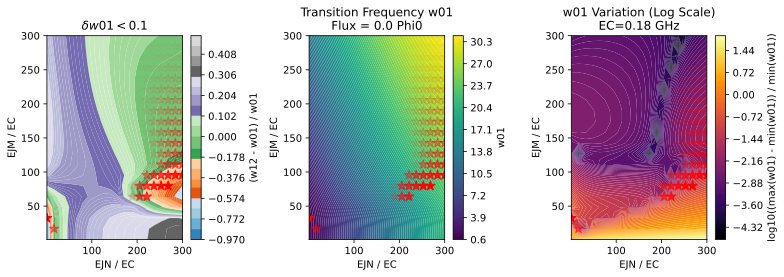

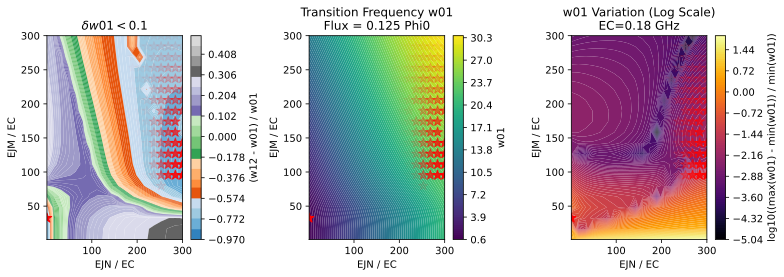

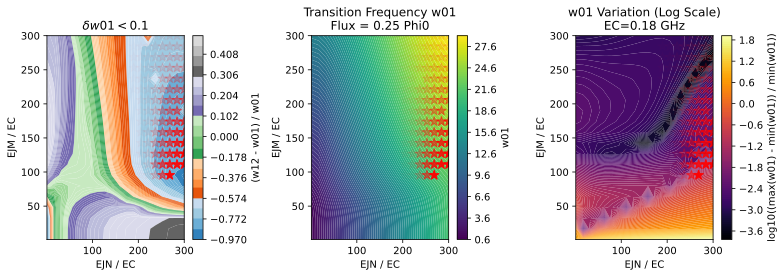

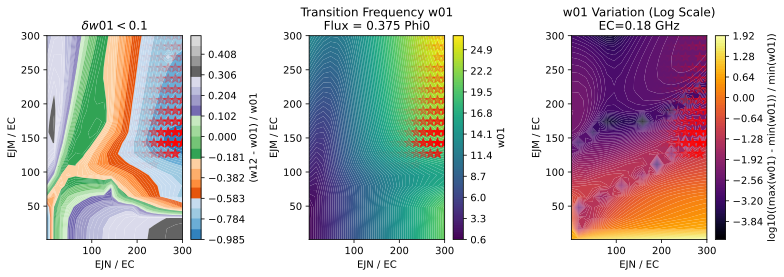

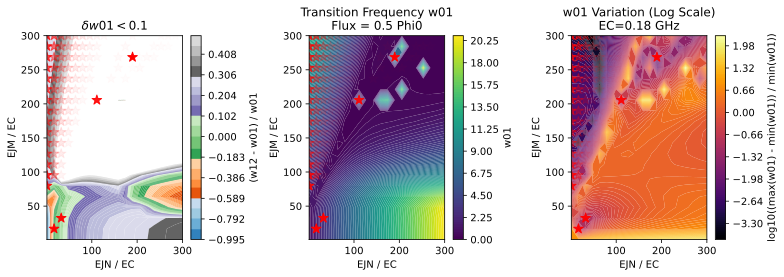

...

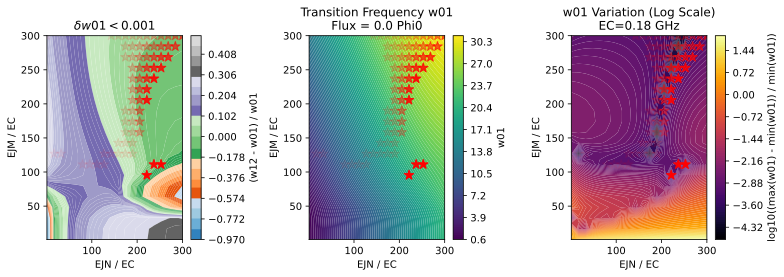

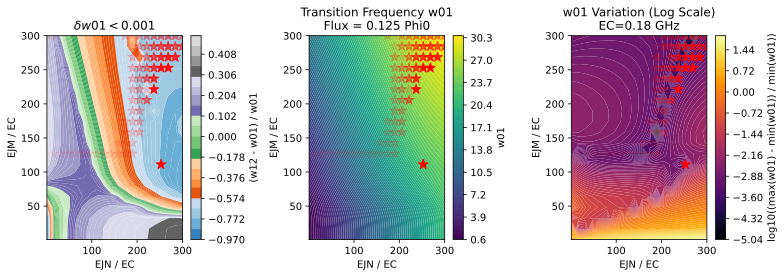

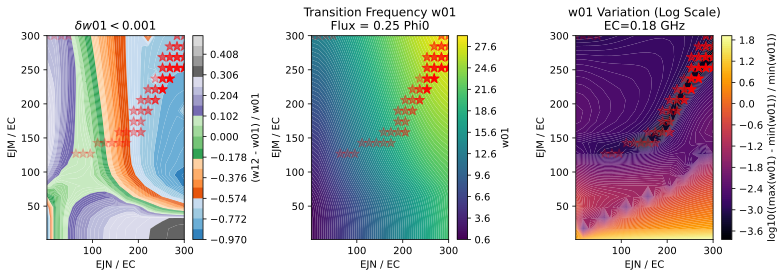

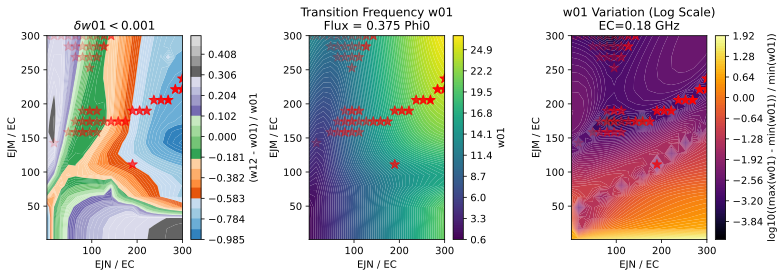

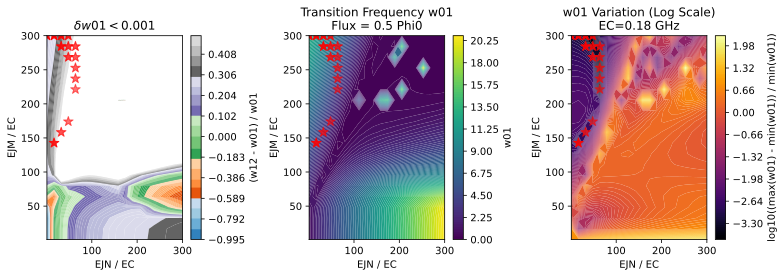

In [23]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.colors as colors

w01_variation_levels = [1e-1, 10**(-2), 10**(-3)]

for w01_variation_lev in w01_variation_levels:

    for k, flux_value in enumerate(flux_list):

        EJN_grid, EJM_grid = np.meshgrid(EJN_list, EJM_list)

        # Extract arrays for the current flux value
        relative_anharm_list = relative_anharm_list_flux[:, :, k]
        w01_list = w01_list_flux[:, :, k]
        w01_variation_list = w01_variation_list_flux[:, :, k]

        # Replace NaN values in relative_anharm_list
        relative_anharm_list[np.isnan(relative_anharm_list)] = 1

        # Create DataFrame for all data points
        data = {
            'EJN': EJN_grid.flatten(),
            'EJM': EJM_grid.flatten(),
            'RelativeAnharmonicity': relative_anharm_list.flatten(),
            'w01': w01_list.flatten(),
            'w01Variation': w01_variation_list.flatten()
        }
        df = pd.DataFrame(data)

        # Filter rows where w01Variation < 10^(-1)
        filtered_df = df[df['w01Variation'] < w01_variation_lev]

        # Identify the top N_anharm points (lowest anharmonicity values)
        N_anharm = 100
        best_points = filtered_df.nsmallest(N_anharm, 'RelativeAnharmonicity')

        # Adjust alpha values for star-points
        best_anharm_values = best_points['RelativeAnharmonicity'].values

        if len(best_anharm_values) == 0:
            break

        alphas = np.ones(N_anharm)
        for i in range(1, N_anharm):
            if abs(best_anharm_values[i] - best_anharm_values[i - 1]) > 1e-3:
                alphas[i:] = np.logspace(0, -2, N_anharm - i)
                break

        # Plot with contourf and overlay star-points
        fig, axes = plt.subplots(1, 3, figsize=(11, 4))

        # First subplot: Relative Anharmonicity
        norm = colors.TwoSlopeNorm(vmin=df['RelativeAnharmonicity'].min(), vcenter=0, vmax=0.5)
        levels = np.concatenate((np.linspace(df['RelativeAnharmonicity'].min(), -1e-5, 50), 
                                np.linspace(0, 0.5, 50)))
        im1 = axes[0].contourf(EJN_grid / EC_shunt, EJM_grid / EC_shunt, 
                            relative_anharm_list, levels=levels, cmap='tab20c', norm=norm)
        fig.colorbar(im1, ax=axes[0], label='(w12 - w01) / w01')
        axes[0].set_title(r"$\delta w01 < {}$".format(round(w01_variation_lev, 3)))
        axes[0].set_xlabel('EJN / EC')
        axes[0].set_ylabel('EJM / EC')

        # Overlay star-points
        axes[0].scatter(best_points['EJN'] / EC_shunt, best_points['EJM'] / EC_shunt, 
                        s=100, c='red', marker='*', alpha=alphas)

        # Second subplot: w01
        im2 = axes[1].contourf(EJN_grid / EC_shunt, EJM_grid / EC_shunt, 
                            w01_list, levels=100, cmap='viridis')
        fig.colorbar(im2, ax=axes[1], label='w01')
        axes[1].set_title(f"Transition Frequency w01\nFlux = {flux_value} Phi0")
        axes[1].set_xlabel('EJN / EC')
        axes[1].set_ylabel('EJM / EC')

        # Overlay star-points
        axes[1].scatter(best_points['EJN'] / EC_shunt, best_points['EJM'] / EC_shunt, 
                        s=100, c='red', marker='*', alpha=alphas)

        # Third subplot: Log10 of w01 Variation
        im3 = axes[2].contourf(EJN_grid / EC_shunt, EJM_grid / EC_shunt, 
                            np.log10(w01_variation_list), levels=100, cmap='inferno')
        fig.colorbar(im3, ax=axes[2], label='log10((max(w01) - min(w01)) / min(w01))')
        axes[2].set_title(f"w01 Variation (Log Scale)\nEC={round(EC_shunt, 2)} GHz")
        axes[2].set_xlabel('EJN / EC')
        axes[2].set_ylabel('EJM / EC')

        # Overlay star-points
        axes[2].scatter(best_points['EJN'] / EC_shunt, best_points['EJM'] / EC_shunt, 
                        s=100, c='red', marker='*', alpha=alphas)

        # Adjust layout and save the figure
        plt.tight_layout()
        plt.savefig(f"./data_figures/N={N}_M={M}_EC={round(EC_shunt, 2)}_flux_{k}_combined_plots.pdf")
        plt.show()


In [7]:
# import tensorflow as tf
devices = tf.config.list_physical_devices()
print("\nDevices: ", devices)

gpus = tf.config.list_physical_devices('GPU')
if gpus:
  details = tf.config.experimental.get_device_details(gpus[0])
  print("GPU details: ", details)


Devices:  [PhysicalDevice(name='/physical_device:CPU:0', device_type='CPU'), PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU')]
GPU details:  {'device_name': 'METAL'}


In [8]:
devices[0]

PhysicalDevice(name='/physical_device:CPU:0', device_type='CPU')

In [9]:
import tensorflow as tf
import numpy as np
import time

# Generate a large random symmetric matrix
symmetric_matrix = nmon.H.toarray()

# Convert to TensorFlow tensor
matrix_tensor = tf.constant(symmetric_matrix, dtype=tf.float32)

# Function to solve eigenproblem and measure time
def compute_eigenproblem(matrix, device):
    with tf.device(device):
        start_time = time.time()
        eigenvalues, eigenvectors = tf.linalg.eigh(matrix)  # Symmetric matrix
        elapsed_time = time.time() - start_time
    return eigenvalues, eigenvectors, elapsed_time

# Solve on GPU
gpu_eigenvalues, gpu_eigenvectors, gpu_time = compute_eigenproblem(matrix_tensor, "GPU")

# Solve on CPU
cpu_eigenvalues, cpu_eigenvectors, cpu_time = compute_eigenproblem(matrix_tensor, "CPU")

# Compare results
print("GPU Time: {:.2f} seconds".format(gpu_time))
print("CPU Time: {:.2f} seconds".format(cpu_time))
print("Eigenvalue Difference: {:.6e}".format(tf.reduce_max(tf.abs(gpu_eigenvalues - cpu_eigenvalues)).numpy()))


GPU Time: 9.25 seconds
CPU Time: 8.93 seconds
Eigenvalue Difference: 0.000000e+00


In [ ]:
import numpy as np
from np_eigh_cython import compute_eigsh_np


In [14]:

# Call the compiled function
evals, evecs = compute_eigsh_np(nmon.H_arr) # currently, complex implementation

print("Eigenvalues:", evals)

Eigenvalues: [-1.55349854e+01 -1.06974753e+01 -6.05111544e+00 ...  5.26679807e+05
  5.71681906e+05  5.71681906e+05]


In [17]:
import numpy as np
from numba import njit

@njit
def compute_eigh(H):
    return np.linalg.eigh(H)

In [18]:

eigenvalues, eigenvectors = compute_eigh(np.real(nmon.H_arr))